# Mount Google Drive & Load Dataset

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# Replace this path with the actual path where your CSV file is located in Drive
file_path = '/content/drive/MyDrive/Datathon/Vehicle Data - Virginia Department of Motor Vehicles.csv'

import pandas as pd
df = pd.read_csv(file_path)

print("Shape:", df.shape)
df.head()

Shape: (691843, 34)


,VehicleYear,VehicleDisabled,VehicleTowed,VehiclePlateState,VehicleOversize,VehicleCargoSpill,VehicleOverride,VehicleUnderride,VehicleSpeedBeforeCrash,VehicleSpeedLimit,...,SecondEvent_Category,ThirdEvent_Value,ThirdEvent_Category,FourthEvent_Value,FourthEvent_Category,MostHarmfulEvent_Value,MostHarmfulEvent_Category,Crash_UID,Vehicle_UID,Driver_UID
0,2021.0,Yes,Yes,VA,No,No,No,No,95.0,60.0,...,Collision with Fixed Object,Overturn (Rollover),Non-Collision,NaN,NaN,Overturn (Rollover),Non-Collision,c1470131,v1866344,d4800658
1,2012.0,Yes,Yes,VA,No,No,No,No,65.0,65.0,...,NaN,NaN,NaN,NaN,NaN,Animal,"Collision with Person, Motor Vehicle or Non-Fi...",c4015011,v5502266,d8726944
2,2018.0,No,Yes,VA,No,No,No,No,45.0,55.0,...,NaN,NaN,NaN,NaN,NaN,Bank Or Ledge,Collision with Fixed Object,c0772990,v1158455,d2620685
3,2018.0,Yes,Yes,MD,No,No,No,No,55.0,55.0,...,NaN,NaN,NaN,NaN,NaN,Animal,"Collision with Person, Motor Vehicle or Non-Fi...",c5831068,v5934728,d5443516
4,2009.0,Yes,Yes,VA,No,No,No,No,30.0,45.0,...,Collision with Fixed Object,NaN,NaN,NaN,NaN,Curb,Collision with Fixed Object,c9026687,v4789409,d8094099


# Data Cleaning & Preprocessing

In [ ]:
# Convert speed columns to numeric
cols_to_numeric = ['VehicleSpeedBeforeCrash', 'VehicleSpeedLimit', 'VehicleMaximumSafeSpeed']
for col in cols_to_numeric:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Fill NA for categorical columns with 'Unknown'
categorical_cols = df.select_dtypes(include='object').columns
df[categorical_cols] = df[categorical_cols].fillna('Unknown')

# Fill numeric NaNs with median
numeric_cols = df.select_dtypes(include='number').columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())

# Check cleaned data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 691843 entries, 0 to 691842
Data columns (total 34 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   VehicleYear                  691843 non-null  float64
 1   VehicleDisabled              691843 non-null  object 
 2   VehicleTowed                 691843 non-null  object 
 3   VehiclePlateState            691843 non-null  object 
 4   VehicleOversize              691843 non-null  object 
 5   VehicleCargoSpill            691843 non-null  object 
 6   VehicleOverride              691843 non-null  object 
 7   VehicleUnderride             691843 non-null  object 
 8   VehicleSpeedBeforeCrash      691843 non-null  float64
 9   VehicleSpeedLimit            691843 non-null  float64
 10  VehicleMaximumSafeSpeed      691843 non-null  float64
 11  VehicleSpeedLimit_Grouped    691843 non-null  object 
 12  SkiddingOrTireMarkVisible    691843 non-null  object 
 13 

# Add Over-Speeding & Severity Score

In [ ]:
# Create new column: OverSpeeding = 1 if speed before crash > speed limit
df['OverSpeeding'] = (df['VehicleSpeedBeforeCrash'] > df['VehicleSpeedLimit']).astype(int)

# Crash Severity Score — rule-based scoring
def compute_crash_severity(row):
    score = 0
    score += 2 if row['VehicleDisabled'] == 'Yes' else 0
    score += 2 if row['VehicleTowed'] == 'Yes' else 0
    score += 2 if 'Severe' in row['VehicleDamage'] else 0
    score += 3 if row['MostHarmfulEvent_Category'] == 'Collision with Person, Motor Vehicle or Non-Fixed Object' else 0
    score += 2 if row['OverSpeeding'] == 1 else 0
    return score

df['CrashSeverityScore'] = df.apply(compute_crash_severity, axis=1)

df[['VehicleDisabled', 'VehicleTowed', 'VehicleDamage', 'MostHarmfulEvent_Category', 'OverSpeeding', 'CrashSeverityScore']].head()

,VehicleDisabled,VehicleTowed,VehicleDamage,MostHarmfulEvent_Category,OverSpeeding,CrashSeverityScore
0,Yes,Yes,Totaled,Non-Collision,1,6
1,Yes,Yes,Motor,"Collision with Person, Motor Vehicle or Non-Fi...",0,7
2,No,Yes,Other,Collision with Fixed Object,0,2
3,Yes,Yes,Other,"Collision with Person, Motor Vehicle or Non-Fi...",0,7
4,Yes,Yes,Other,Collision with Fixed Object,0,4


# Explore Crash Severity Distribution

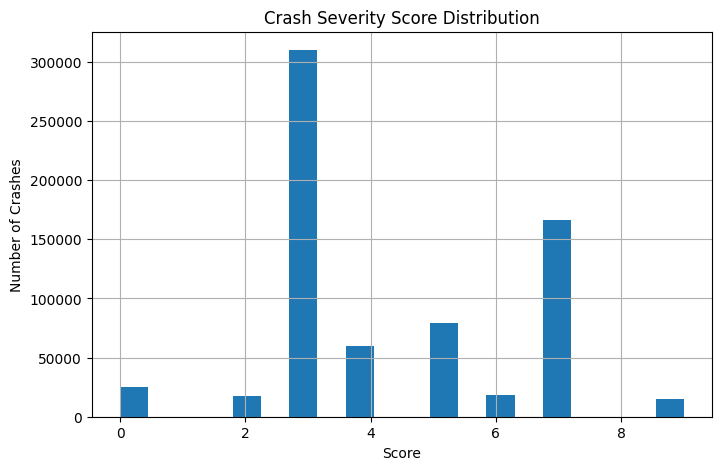

In [ ]:
import matplotlib.pyplot as plt

# Histogram of Crash Severity Scores
plt.figure(figsize=(8,5))
df['CrashSeverityScore'].hist(bins=20)
plt.title("Crash Severity Score Distribution")
plt.xlabel("Score")
plt.ylabel("Number of Crashes")
plt.grid(True)
plt.show()

# Top 10 Most Harmful Events

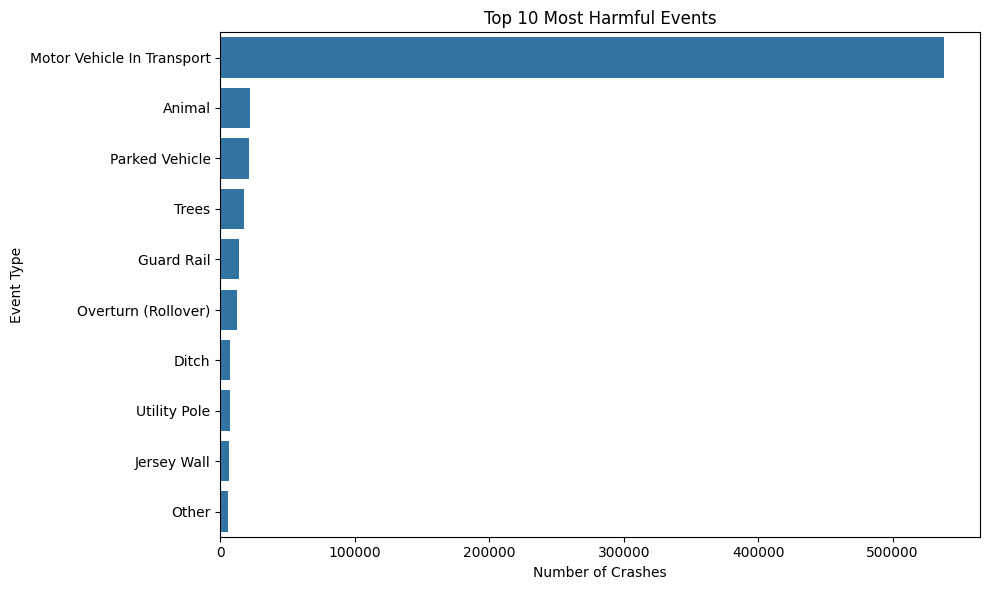

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

top_events = df['MostHarmfulEvent_Value'].value_counts().head(10)

plt.figure(figsize=(10,6))
sns.barplot(x=top_events.values, y=top_events.index)
plt.title("Top 10 Most Harmful Events")
plt.xlabel("Number of Crashes")
plt.ylabel("Event Type")
plt.tight_layout()
plt.show()

# Vehicle Body Type vs. Crash Severity

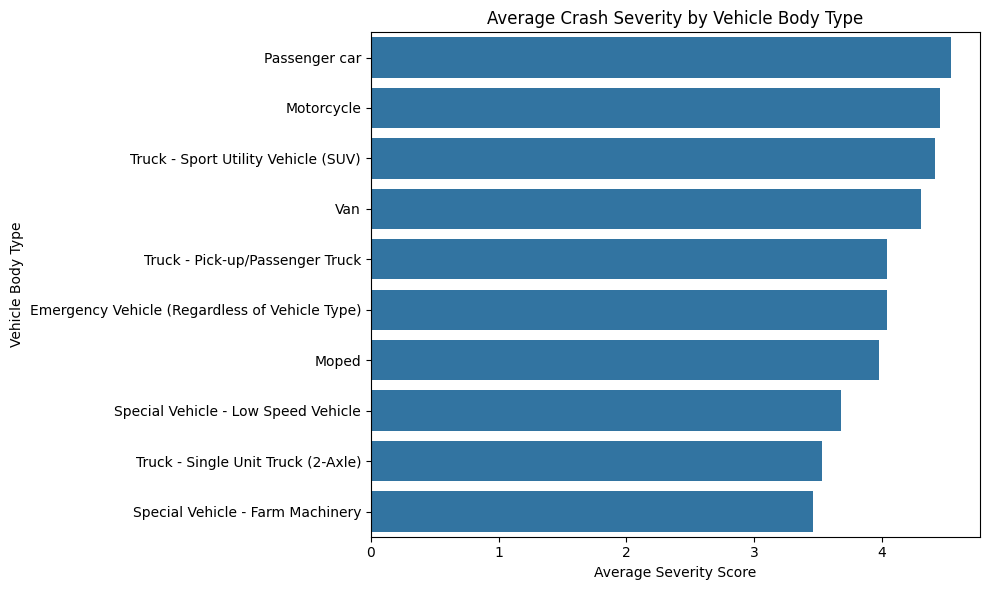

In [ ]:
body_severity = df.groupby('VehicleBodyType')['CrashSeverityScore'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(10,6))
sns.barplot(x=body_severity.values, y=body_severity.index)
plt.title("Average Crash Severity by Vehicle Body Type")
plt.xlabel("Average Severity Score")
plt.ylabel("Vehicle Body Type")
plt.tight_layout()
plt.show()

# Over-Speeding vs. Severity

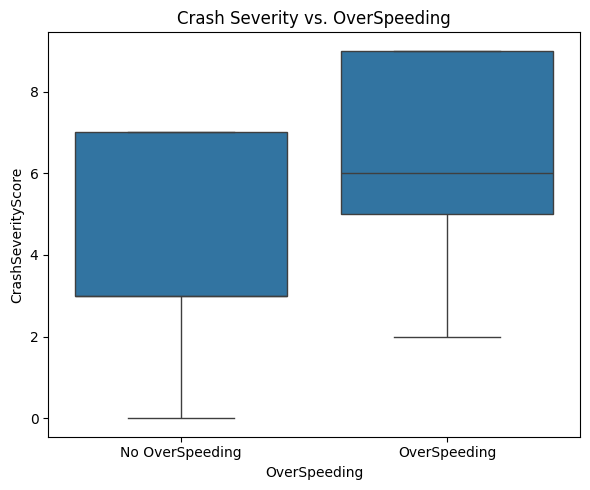

In [ ]:
# Compare severity for over-speeding and not
plt.figure(figsize=(6,5))
sns.boxplot(x='OverSpeeding', y='CrashSeverityScore', data=df)
plt.title("Crash Severity vs. OverSpeeding")
plt.xticks([0,1], ['No OverSpeeding', 'OverSpeeding'])
plt.tight_layout()
plt.show()

# Crash Clustering (KMeans)

<ipython-input-10-862a2a0a92f4>:24: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


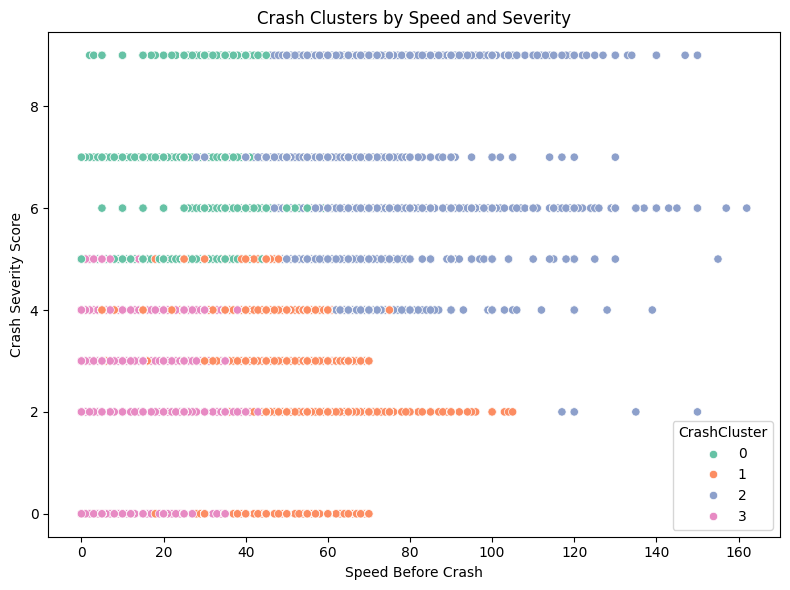

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Select features for clustering
cluster_features = df[['VehicleSpeedBeforeCrash', 'VehicleSpeedLimit', 'CrashSeverityScore']]
cluster_features = cluster_features.dropna()

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(cluster_features)

# KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=42)
df['CrashCluster'] = kmeans.fit_predict(X_scaled)

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(x=cluster_features['VehicleSpeedBeforeCrash'],
                y=cluster_features['CrashSeverityScore'],
                hue=df['CrashCluster'], palette='Set2')
plt.title("Crash Clusters by Speed and Severity")
plt.xlabel("Speed Before Crash")
plt.ylabel("Crash Severity Score")
plt.tight_layout()
plt.show()

# Correlation Heatmap

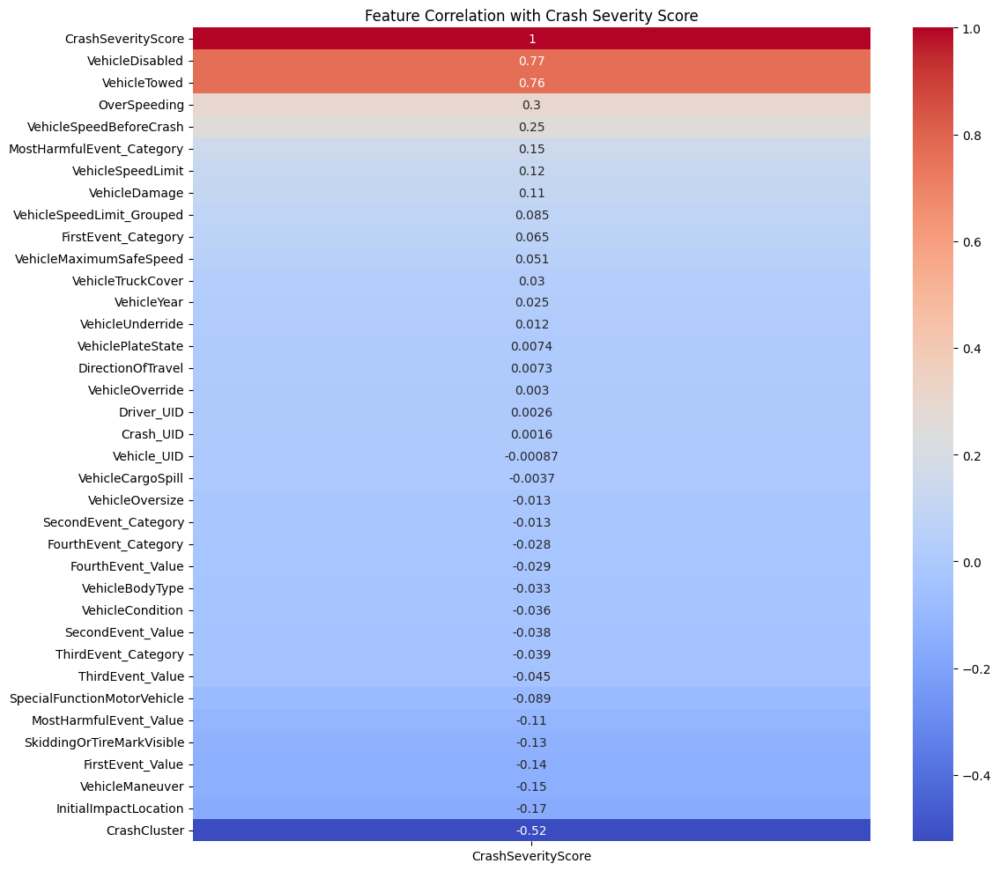

In [ ]:
# Encode object fields for correlation
df_encoded = df.copy()
for col in df_encoded.select_dtypes(include='object'):
    df_encoded[col] = df_encoded[col].astype('category').cat.codes

# Compute correlation
correlation = df_encoded.corr(numeric_only=True)

plt.figure(figsize=(12,10))
sns.heatmap(correlation[['CrashSeverityScore']].sort_values(by='CrashSeverityScore', ascending=False),
            annot=True, cmap='coolwarm')
plt.title("Feature Correlation with Crash Severity Score")
plt.tight_layout()
plt.show()

# New Severity Score with Balanced Weights

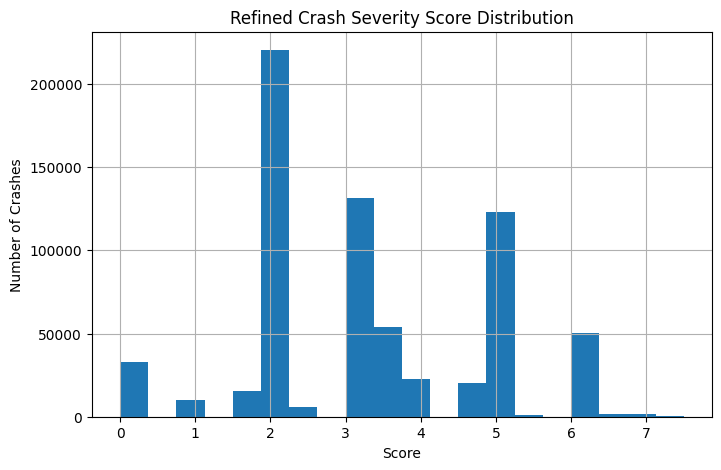

In [ ]:
# Create Speed Differential
df['SpeedDiff'] = df['VehicleSpeedBeforeCrash'] - df['VehicleSpeedLimit']
df['SpeedDiff'] = df['SpeedDiff'].fillna(0)

# Revised crash severity score
def new_crash_score(row):
    score = 0
    # Weight-based scoring
    score += 1.5 if row['VehicleDisabled'] == 'Yes' else 0
    score += 1.5 if row['VehicleTowed'] == 'Yes' else 0
    score += 1 if 'Severe' in row['VehicleDamage'] else 0
    score += 2 if row['MostHarmfulEvent_Value'] in ['Overturn (Rollover)', 'Head-On', 'Motor Vehicle In Transport'] else 0
    score += 1 if row['VehicleBodyType'] in ['Motorcycle', 'Truck - Sport Utility Vehicle (SUV)'] else 0
    score += 1.5 if row['SpeedDiff'] > 15 else (1 if row['SpeedDiff'] > 5 else 0)
    return score

df['RefinedSeverityScore'] = df.apply(new_crash_score, axis=1)

# Visualize new score
import matplotlib.pyplot as plt
plt.figure(figsize=(8,5))
df['RefinedSeverityScore'].hist(bins=20)
plt.title("Refined Crash Severity Score Distribution")
plt.xlabel("Score")
plt.ylabel("Number of Crashes")
plt.grid(True)
plt.show()

# Speed Differential Analysis

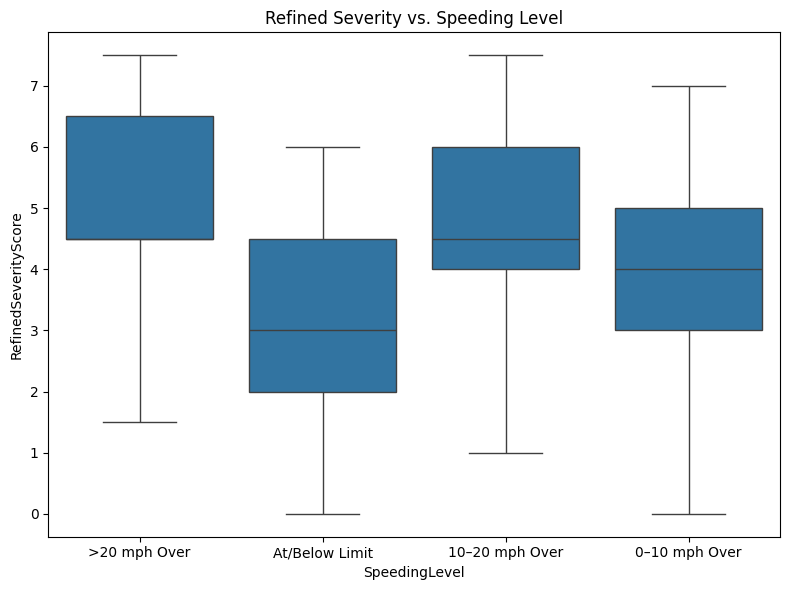

In [ ]:
# Bin speed difference
def speed_category(x):
    if x <= 0:
        return 'At/Below Limit'
    elif x <= 10:
        return '0–10 mph Over'
    elif x <= 20:
        return '10–20 mph Over'
    else:
        return '>20 mph Over'

df['SpeedingLevel'] = df['SpeedDiff'].apply(speed_category)

# Plot severity by speed level
import seaborn as sns
plt.figure(figsize=(8,6))
sns.boxplot(x='SpeedingLevel', y='RefinedSeverityScore', data=df)
plt.title("Refined Severity vs. Speeding Level")
plt.tight_layout()
plt.show()

# Crash Cluster Profiles

In [ ]:
# Profile each cluster
cluster_summary = df.groupby('CrashCluster').agg({
    'VehicleSpeedBeforeCrash': 'mean',
    'SpeedDiff': 'mean',
    'RefinedSeverityScore': ['mean', 'count'],
    'VehicleBodyType': lambda x: x.mode().iloc[0],
    'MostHarmfulEvent_Value': lambda x: x.mode().iloc[0]
}).reset_index()

# Rename columns
cluster_summary.columns = ['CrashCluster', 'AvgSpeedBeforeCrash', 'AvgSpeedDiff', 'AvgSeverity', 'CrashCount', 'TopBodyType', 'TopEvent']
import pandas as pd
import IPython.display as display
display.display(cluster_summary)

,CrashCluster,AvgSpeedBeforeCrash,AvgSpeedDiff,AvgSeverity,CrashCount,TopBodyType,TopEvent
0,0,21.045594,-16.689737,4.748084,165089,Passenger car,Motor Vehicle In Transport
1,1,38.408006,-15.143832,2.419299,175990,Passenger car,Motor Vehicle In Transport
2,2,55.785781,-0.359922,4.592143,98049,Passenger car,Motor Vehicle In Transport
3,3,12.655110,-21.077340,2.159458,252715,Passenger car,Motor Vehicle In Transport


# Feature Importance Using Tree-Based Model

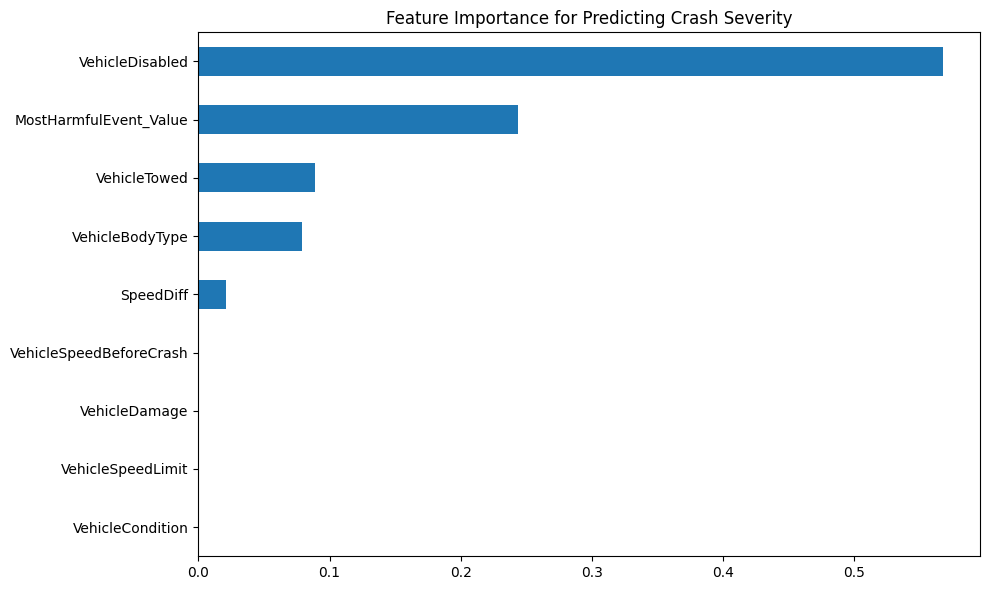

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder

# Select and encode features
features = ['VehicleSpeedBeforeCrash', 'VehicleSpeedLimit', 'SpeedDiff', 'VehicleBodyType',
            'VehicleDamage', 'VehicleCondition', 'VehicleTowed', 'VehicleDisabled', 'MostHarmfulEvent_Value']
df_model = df[features + ['RefinedSeverityScore']].copy()

# Encode categoricals
for col in df_model.select_dtypes(include='object').columns:
    df_model[col] = LabelEncoder().fit_transform(df_model[col])

X = df_model.drop('RefinedSeverityScore', axis=1)
y = df_model['RefinedSeverityScore']

# Train model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Feature importance
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=True)
plt.figure(figsize=(10,6))
importances.plot(kind='barh')
plt.title("Feature Importance for Predicting Crash Severity")
plt.tight_layout()
plt.show()

# Final Insight Summary Table (Policy-Oriented)

In [ ]:
policy_data = {
    "Risk Type": [
        "High-Speed Crashes",
        "Rollovers & Head-On Collisions",
        "SUV/Motorcycle Related",
        "Disabled Vehicles",
        "Frequent Towing",
    ],
    "Pattern": [
        "SpeedDiff > 15 mph",
        "Event = Overturn or Head-On",
        "BodyType = SUV or Motorcycle",
        "VehicleDisabled = Yes",
        "VehicleTowed = Yes"
    ],
    "Suggested Investment": [
        "Install speed enforcement cameras, adjust speed limits",
        "Install median barriers, improve signage, lighting",
        "Crash-resistant guard rails, public awareness campaigns",
        "Breakdown lanes, emergency response time reduction",
        "Improve road surfaces & signage to prevent loss of control"
    ]
}

df_policy = pd.DataFrame(policy_data)
display.display(df_policy)

,Risk Type,Pattern,Suggested Investment
0,High-Speed Crashes,SpeedDiff > 15 mph,"Install speed enforcement cameras, adjust spee..."
1,Rollovers & Head-On Collisions,Event = Overturn or Head-On,"Install median barriers, improve signage, ligh..."
2,SUV/Motorcycle Related,BodyType = SUV or Motorcycle,"Crash-resistant guard rails, public awareness ..."
3,Disabled Vehicles,VehicleDisabled = Yes,"Breakdown lanes, emergency response time reduc..."
4,Frequent Towing,VehicleTowed = Yes,Improve road surfaces & signage to prevent los...


# Infrastructure Mismatch Index

In [ ]:
# Top 10 crash UIDs with highest average severity
top_danger_areas = df.groupby('Crash_UID')['RefinedSeverityScore'].mean().sort_values(ascending=False).head(10)
print(top_danger_areas)

Crash_UID
c7869367    7.5
c2084382    7.5
c0820180    7.5
c8592289    7.5
c1792990    7.5
c8693476    7.5
c3897125    7.5
c6836572    7.5
c5631755    7.5
c6836234    7.5
Name: RefinedSeverityScore, dtype: float64


In [ ]:
# Fill NAs for logic to work
df['MostHarmfulEvent_Value'] = df['MostHarmfulEvent_Value'].fillna("Unknown")
df['VehicleManeuver'] = df['VehicleManeuver'].fillna("Unknown")

# Infrastructure mismatch score based on risky combo of:
# - Speeding
# - Collision with fixed objects
# - Turning maneuvers
df['MismatchIndex'] = df['SpeedDiff'].clip(lower=0)  # Speed over limit only

# Add +1 if hitting a fixed object
fixed_objects = ['Tree', 'Utility Pole', 'Jersey Wall', 'Ditch', 'Guard Rail', 'Curb', 'Fence']
df['MismatchIndex'] += df['MostHarmfulEvent_Value'].apply(lambda x: 1 if x in fixed_objects else 0)

# Add +1 if maneuver was turning or lane change
turning_actions = ['Turning Left', 'Turning Right', 'Changing Lanes', 'Passing']
df['MismatchIndex'] += df['VehicleManeuver'].apply(lambda x: 1 if x in turning_actions else 0)

# Display top mismatched crashes
df[['Crash_UID', 'SpeedDiff', 'MostHarmfulEvent_Value', 'VehicleManeuver', 'MismatchIndex']].sort_values(by='MismatchIndex', ascending=False).head(10)

,Crash_UID,SpeedDiff,MostHarmfulEvent_Value,VehicleManeuver,MismatchIndex
188216,c4277416,125.0,Parked Vehicle,Parked,125.0
425766,c5874667,120.0,Motor Vehicle In Transport,Going Straight Ahead,120.0
170444,c1357347,115.0,Parked Vehicle,Going Straight Ahead,115.0
689008,c5885032,105.0,Parked Vehicle,Going Straight Ahead,105.0
689599,c3691124,102.0,Ditch,Ran Off Road - Left,103.0
106283,c5030221,102.0,Bank Or Ledge,Ran Off Road - Right,102.0
600697,c0673554,98.0,"Sign, Traffic Signal",Going Straight Ahead,98.0
577735,c1195306,95.0,Guard Rail,Going Straight Ahead,96.0
546598,c2215346,95.0,Other Fixed Object,Ran Off Road - Left,95.0
55650,c5255967,94.0,Trees,Making Right Turn,94.0


# Grouping Crash_UIDs by Frequency and Severity

In [ ]:
# Group by Crash_UID and count + average severity
crash_uid_summary = df.groupby('Crash_UID').agg({
    'RefinedSeverityScore': ['count', 'mean']
}).reset_index()

# Rename columns
crash_uid_summary.columns = ['Crash_UID', 'CrashCount', 'AvgSeverity']

# Filter: at least 3 crashes at the same UID and high severity
repeat_high_severity = crash_uid_summary[(crash_uid_summary['CrashCount'] >= 3) &
                                         (crash_uid_summary['AvgSeverity'] >= 6)].sort_values(by='AvgSeverity', ascending=False)

repeat_high_severity.head(10)


,Crash_UID,CrashCount,AvgSeverity
183808,c4861027,3,6.666667
18691,c0495991,4,6.500000
139322,c3681519,3,6.500000
39050,c1031753,3,6.500000
290455,c7665981,3,6.500000
311415,c8221626,3,6.500000
332962,c8788303,3,6.500000
328359,c8666769,3,6.500000
234969,c6203753,3,6.500000
93562,c2471062,3,6.333333


# Join With Mismatch Index

In [ ]:
# Join with mismatch
merged_repeat = df.merge(repeat_high_severity, on='Crash_UID', how='inner')
merged_repeat = merged_repeat[['Crash_UID', 'MismatchIndex', 'CrashCount', 'AvgSeverity']].drop_duplicates()

# Sort by mismatch + severity
merged_repeat.sort_values(by=['AvgSeverity', 'MismatchIndex'], ascending=False).head(10)

,Crash_UID,MismatchIndex,CrashCount,AvgSeverity
370,c4861027,45.0,3,6.666667
372,c4861027,0.0,3,6.666667
154,c8666769,45.0,3,6.500000
70,c7665981,38.0,3,6.500000
277,c1031753,36.0,3,6.500000
6,c8788303,35.0,3,6.500000
187,c8221626,35.0,3,6.500000
115,c3681519,26.0,3,6.500000
407,c6203753,20.0,3,6.500000
203,c0495991,16.0,4,6.500000


# Identify Repeat, High-Severity Crash UIDs


In [ ]:
# Group by Crash_UID with crash count and avg severity
crash_uid_summary = df.groupby('Crash_UID').agg({
    'RefinedSeverityScore': ['count', 'mean'],
    'MismatchIndex': 'mean'
}).reset_index()

# Rename columns
crash_uid_summary.columns = ['Crash_UID', 'CrashCount', 'AvgSeverity', 'AvgMismatch']

# Filter: Repeat (>=3) and High Severity (>=6)
repeat_high_severity = crash_uid_summary[
    (crash_uid_summary['CrashCount'] >= 3) &
    (crash_uid_summary['AvgSeverity'] >= 6)
].sort_values(by=['AvgSeverity', 'AvgMismatch'], ascending=False)

repeat_high_severity.head(10)

,Crash_UID,CrashCount,AvgSeverity,AvgMismatch
183808,c4861027,3,6.666667,30.000000
328359,c8666769,3,6.500000,21.666667
39050,c1031753,3,6.500000,18.666667
290455,c7665981,3,6.500000,15.666667
18691,c0495991,4,6.500000,11.750000
311415,c8221626,3,6.500000,11.666667
332962,c8788303,3,6.500000,11.666667
139322,c3681519,3,6.500000,8.666667
234969,c6203753,3,6.500000,6.666667
223581,c5904478,3,6.333333,10.000000


# Create a Final Actionable Summary Table

In [ ]:
# Enrich with contextual data
enriched = df[['Crash_UID', 'MostHarmfulEvent_Value', 'VehicleBodyType', 'VehicleManeuver']].drop_duplicates()
summary_table = repeat_high_severity.merge(enriched, on='Crash_UID', how='left')

# Final columns
summary_table = summary_table[['Crash_UID', 'CrashCount', 'AvgSeverity', 'AvgMismatch',
                               'MostHarmfulEvent_Value', 'VehicleBodyType', 'VehicleManeuver']]

# Sort and display
summary_table = summary_table.sort_values(by=['AvgSeverity', 'AvgMismatch'], ascending=False).head(10)
import IPython.display as display
display.display(summary_table)

,Crash_UID,CrashCount,AvgSeverity,AvgMismatch,MostHarmfulEvent_Value,VehicleBodyType,VehicleManeuver
0,c4861027,3,6.666667,30.000000,Motor Vehicle In Transport,Truck - Sport Utility Vehicle (SUV),Merging Into Traffic Lane
1,c4861027,3,6.666667,30.000000,Motor Vehicle In Transport,Passenger car,Going Straight Ahead
2,c4861027,3,6.666667,30.000000,Motor Vehicle In Transport,Truck - Sport Utility Vehicle (SUV),Ran Off Road - Left
3,c8666769,3,6.500000,21.666667,Motor Vehicle In Transport,Passenger car,Going Straight Ahead
4,c8666769,3,6.500000,21.666667,Motor Vehicle In Transport,Truck - Sport Utility Vehicle (SUV),Going Straight Ahead
5,c8666769,3,6.500000,21.666667,Motor Vehicle In Transport,Van,Going Straight Ahead
6,c1031753,3,6.500000,18.666667,Motor Vehicle In Transport,Passenger car,Changing Lanes
7,c1031753,3,6.500000,18.666667,Motor Vehicle In Transport,Passenger car,Going Straight Ahead
8,c1031753,3,6.500000,18.666667,Motor Vehicle In Transport,Truck - Sport Utility Vehicle (SUV),Going Straight Ahead
9,c7665981,3,6.500000,15.666667,Motor Vehicle In Transport,Passenger car,Other


In [ ]:
def generate_recommendation(row):
    base = f"Crash site {row['Crash_UID']} has had {row['CrashCount']} crashes averaging severity {row['AvgSeverity']:.1f}."
    if row['MostHarmfulEvent_Value'] in ['Utility Pole', 'Guard Rail', 'Ditch']:
        infra = "Recommend physical barrier upgrades or object setbacks."
    elif row['VehicleManeuver'] in ['Turning Left', 'Turning Right']:
        infra = "Suggest intersection redesign or turn-slowing measures."
    elif row['AvgMismatch'] > 10:
        infra = "Mismatch with speed and road design — suggest speed calming and signage."
    else:
        infra = "Suggest comprehensive site inspection."

    return base + " " + infra

summary_table['Recommendation'] = summary_table.apply(generate_recommendation, axis=1)
display.display(summary_table[['Crash_UID', 'Recommendation']])

,Crash_UID,Recommendation
0,c4861027,Crash site c4861027 has had 3 crashes averagin...
1,c4861027,Crash site c4861027 has had 3 crashes averagin...
2,c4861027,Crash site c4861027 has had 3 crashes averagin...
3,c8666769,Crash site c8666769 has had 3 crashes averagin...
4,c8666769,Crash site c8666769 has had 3 crashes averagin...
5,c8666769,Crash site c8666769 has had 3 crashes averagin...
6,c1031753,Crash site c1031753 has had 3 crashes averagin...
7,c1031753,Crash site c1031753 has had 3 crashes averagin...
8,c1031753,Crash site c1031753 has had 3 crashes averagin...
9,c7665981,Crash site c7665981 has had 3 crashes averagin...


In [ ]:
#!pip install folium
import folium
import random
import pandas as pd

In [ ]:
# Load your new geo-enabled dataset
geo_df = pd.read_csv("/content/drive/MyDrive/Datathon/CrashUID_Matches_Vehicle.csv")

# Extract the right 7 digits to match Crash_UID
geo_df['Crash_UID'] = geo_df['Document Nbr'].astype(str).str[-7:]

# Also extract right 7 from original crash dataset
df['Crash_UID_Str'] = df['Crash_UID'].astype(str).str[-7:]

# Merge both datasets using Crash_UID
merged_df = df.merge(geo_df, left_on='Crash_UID_Str', right_on='Crash_UID', how='inner')

# Rename for clarity
merged_df['Latitude'] = pd.to_numeric(merged_df['y'], errors='coerce')
merged_df['Longitude'] = pd.to_numeric(merged_df['x'], errors='coerce')


In [ ]:
# Filter only high severity crashes (score ≥ 6) with valid GPS
high_risk_geo = merged_df[
    (merged_df['RefinedSeverityScore'] >= 6) &
    (merged_df['Latitude'].notnull()) &
    (merged_df['Longitude'].notnull())
]

print(high_risk_geo.shape)
high_risk_geo.head()

(6109, 117)


,VehicleYear,VehicleDisabled,VehicleTowed,VehiclePlateState,VehicleOversize,VehicleCargoSpill,VehicleOverride,VehicleUnderride,VehicleSpeedBeforeCrash,VehicleSpeedLimit,...,Node,Node Offset (ft),x,y,Doc_Start_Two,Doc_Number_Clean,Crash_UID_Clean,Crash_UID_y,Latitude,Longitude
0,2021.0,Yes,Yes,VA,No,No,No,No,95.0,60.0,...,1054590.0,19.76,-76.256611,36.875961,16,1470131,1470131,1470131,36.875961,-76.256611
35,2008.0,Yes,Yes,MA,No,No,No,No,35.0,65.0,...,NaN,NaN,-76.608159,37.565685,16,505299,505299,0505299,37.565685,-76.608159
36,2008.0,Yes,Yes,MA,No,No,No,No,35.0,65.0,...,NaN,NaN,-77.485678,39.003723,19,505299,505299,0505299,39.003723,-77.485678
37,2008.0,Yes,Yes,MA,No,No,No,No,35.0,65.0,...,1062828.0,122.95,-76.442197,37.020461,20,505299,505299,0505299,37.020461,-76.442197
38,2008.0,Yes,Yes,MA,No,No,No,No,35.0,65.0,...,268175.0,349.65,-77.185888,38.857801,21,505299,505299,0505299,38.857801,-77.185888


In [ ]:
import folium
from folium.plugins import MarkerCluster

# Center map on median location
center_lat = high_risk_geo['Latitude'].median()
center_lon = high_risk_geo['Longitude'].median()

risk_map = folium.Map(location=[center_lat, center_lon], zoom_start=9)
marker_cluster = MarkerCluster().add_to(risk_map)

def get_color(sev):
    if sev >= 7:
        return 'darkred'
    elif sev >= 6.5:
        return 'orange'
    else:
        return 'blue'

# Add markers
for _, row in high_risk_geo.iterrows():
    popup = f"""
    <b>Crash UID:</b> {row['Crash_UID_x']}<br>
    <b>Severity:</b> {row['RefinedSeverityScore']}<br>
    <b>Vehicle:</b> {row['VehicleBodyType']}<br>
    <b>Event:</b> {row['MostHarmfulEvent_Value']}
    """
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=folium.Popup(popup, max_width=300),
        icon=folium.Icon(color=get_color(row['RefinedSeverityScore']), icon='info-sign')
    ).add_to(marker_cluster)

risk_map.save("real_crash_hotspots_map.html")
risk_map

In [ ]:
from google.colab import files
files.download('real_crash_hotspots_map.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from folium.plugins import HeatMap

heat_points = high_risk_geo[['Latitude', 'Longitude']].dropna().values.tolist()

# Add heatmap layer
heatmap = folium.Map(location=[center_lat, center_lon], zoom_start=9)
HeatMap(heat_points, radius=10).add_to(heatmap)

legend_html = """
<div style="
    position: fixed;
    bottom: 50px; left: 50px; width: 200px; height: 130px;
    background-color: white; z-index:9999;
    font-size:14px; padding:10px;
    box-shadow: 2px 2px 6px rgba(0,0,0,0.3);
    border-radius: 8px;
">
<b>🚦 Severity Legend</b><br>
<i class="fa fa-map-marker fa-2x" style="color:darkred"></i> Very High (7+)<br>
<i class="fa fa-map-marker fa-2x" style="color:orange"></i> High (6.5–7)<br>
<i class="fa fa-map-marker fa-2x" style="color:blue"></i> Moderate (6–6.5)<br>
</div>
"""
risk_map.get_root().html.add_child(folium.Element(legend_html))

heatmap.save("real_crash_heatmap.html")
heatmap